# Introdução

Em 2023, São Paulo apresentou quedas em algumas estatísticas de segurança:
- Homicídios (-13,5%)
- Roubos (-36%)

Por outro lado, os furtos aumentaram:
- Furtos (+7,8%), impactando a sensação de segurança.

O estado enfrenta **um furto a cada 52 segundos**, destacando a gravidade do problema.

Esta análise explora dados da Secretaria de Segurança Pública para obter **insights sobre furtos de celulares em São Paulo** em 2022.


# Dados e Fontes

As fontes utilizadas nesta análise incluem:
- **Google Trends**
- **IBGE**
- **Metrópoles**
- **O Globo**
- **Secretaria de Segurança Pública de SP**
- **The Brazilian Report**

A análise considera dados complementares de interesse público sobre **roubos e furtos** em São Paulo.


# Contexto Adicional

O **Google Trends** revelou que:
- **2023 teve maior interesse no tema** em **65% das semanas**, quando comparado a 2022.

Segundo o **The Brazilian Report**:
- A percepção de insegurança aumentou após a pandemia, mesmo com a redução de homicídios e roubos violentos.
- Crimes de furto retornaram aos níveis pré-pandemia devido ao aumento de circulação das pessoas.


# Discussão

**1. Horários dos Crimes**
- **Noturnos (34%)** superam diurnos (27%).
- **38% dos dados** relacionados ao horário estão ausentes.

**2. Modelos Roubados**
- As marcas mais visadas:
  - **Samsung (38%)**
  - **Motorola (25%)**
  - **Apple (22%)**
- Esses dados refletem tendências do mercado[^5].

**3. Locais dos Roubos**
- **75% dos furtos** ocorrem em vias públicas.
- Locais com segurança privada, como terminais de transporte, registram **5% dos casos**.

**4. Áreas com Maior Ocorrência**
- A **margem leste de São Paulo** concentra a maior parte dos crimes.
- A alta densidade populacional nessas regiões é um fator predominante.

**5. Registro de Ocorrências**
- Há um atraso médio de **24 horas** para registrar boletins de ocorrência, o que prejudica a resposta policial.


### Conclusão

A análise dos dados evidencia que a **maioria dos furtos ocorre em vias públicas**, com pedestres como principais alvos, representando **75% dos casos**. Locais com segurança, como terminais de ônibus e estações de trem, também registram uma parcela significativa (**5%**) de incidentes. Há uma **alta concentração de furtos na margem leste do estado de São Paulo**, especialmente em regiões densamente povoadas, como a cidade de São Paulo.

O **atraso médio de 24 horas no registro** dos crimes prejudica tanto a recuperação dos bens quanto a eficácia policial. Embora mais furtos ocorram durante o dia, os **incidentes noturnos superam** aqueles registrados na tarde e manhã somados, reforçando a necessidade de **vigilância constante**.  

Em relação aos dispositivos, embora o conjunto de dados inclua outros eletrônicos, **Samsung, Motorola e Apple** continuam sendo os principais alvos, refletindo **tendências de mercado**.

**Análises avançadas e modelos preditivos** podem desempenhar um papel crucial no fortalecimento da prevenção e na formulação de estratégias eficazes para aumentar a segurança pública.

In [4]:
import pandas as pd
import plotly.graph_objects as go
import plotly.express as px
import numpy as np
import warnings
import re
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from yellowbrick.cluster import KElbowVisualizer
import plotly.offline as py
py.init_notebook_mode(connected=True)
warnings.filterwarnings("ignore")
pd.set_option('display.max_columns', None)

In [5]:
# Define uma função para carregar e preparar os dados
def preparar_dados(caminho_arquivo, ano):
    df = pd.read_csv(caminho_arquivo, low_memory=False)
    df['Data'] = pd.to_datetime(df['Date'])  # Converte a coluna de datas
    df['Ano'] = ano
    return df

# Carregar e preparar os dados
df_gt_2022 = preparar_dados("GT_2022.csv", 2022)
df_gt_2023 = preparar_dados("GT_2023.csv", 2023)

# Concatenar os DataFrames
df_gt_todos = pd.concat([df_gt_2022, df_gt_2023])

# Criar a figura
fig = go.Figure()

# Definir as cores das linhas
cores = {2022: 'crimson', 2023: 'teal'}

# Adicionar as séries temporais para cada ano com estilos distintos para melhor diferenciação
for ano, cor in cores.items():
    df_ano = df_gt_todos[df_gt_todos['Ano'] == ano]
    fig.add_trace(go.Scatter(x=df_ano['Data'], y=df_ano['Interest'],
                             mode='lines+markers', name=str(ano),
                             line=dict(color=cor, width=2),
                             marker=dict(size=5, line=dict(width=1))))

# Atualizar o layout da figura
fig.update_layout(
    title='Interesse no Google Trends para <b><i>Roubos em São Paulo</i></b> (2022/2023)',
    xaxis_title='Data',
    yaxis_title='Interesse',
    template='plotly_white',  # Tema claro para melhor legibilidade
    xaxis=dict(
        showline=True,  # Mostrar a linha do eixo x
        showgrid=False,  # Ocultar a grade para um visual mais limpo
        linecolor='black',  # Cor da linha do eixo x
        linewidth=2,  # Espessura da linha do eixo x
        ticks='outside',  # Posicionar os ticks fora dos eixos
        tickfont=dict(
            family='Arial, sans-serif',
            size=12,
            color='black'
        ),
    ),
    yaxis=dict(
        showline=True,  # Mostrar a linha do eixo y
        showgrid=False,  # Ocultar a grade
        gridcolor='lightgray',  # Cor da linha da grade
        gridwidth=1,  # Espessura da linha da grade
        linecolor='black',  # Cor da linha do eixo y
        linewidth=2,  # Espessura da linha do eixo y
        ticks='outside',  # Posicionar os ticks fora dos eixos
        tickfont=dict(
            family='Arial, sans-serif',
            size=12,
            color='black'
        ),
    ),
    legend=dict(
        yanchor='top',  # Ancorar a legenda na parte superior
        y=0.99,  # Posicionar a legenda no topo
        xanchor='left',  # Ancorar a legenda à esquerda
        x=0.01  # Posicionar a legenda à esquerda
    ),
    plot_bgcolor='white',  # Cor de fundo branca para contraste
    hovermode='x unified',  # Mostrar uma única caixa de hover para todas as séries
)

# Exibir a figura
fig.show()


In [6]:
# Preparar a figura
fig = go.Figure()

# Adicionar as séries temporais para 2022 e 2023
fig.add_trace(go.Scatter(
    x=df_gt_2022.index,
    y=df_gt_2022['Interest'],
    mode='lines',
    name='2022',
    line=dict(color='crimson')
))

fig.add_trace(go.Scatter(
    x=df_gt_2023.index,
    y=df_gt_2023['Interest'],
    mode='lines',
    name='2023',
    line=dict(color='teal')
))

# Determinar onde 2022 é maior que 2023
for i in range(len(df_gt_2022.index) - 1):
    if df_gt_2022['Interest'].iloc[i] > df_gt_2023['Interest'].iloc[i]:
        fig.add_trace(go.Scatter(
            x=[df_gt_2022.index[i], df_gt_2022.index[i+1], df_gt_2022.index[i+1], df_gt_2022.index[i]],
            y=[df_gt_2022['Interest'].iloc[i], df_gt_2022['Interest'].iloc[i+1], df_gt_2023['Interest'].iloc[i+1], df_gt_2023['Interest'].iloc[i]],
            fill='toself',
            fillcolor='rgba(220,20,60,0.2)',
            line=dict(color='rgba(255,255,255,0)'),
            showlegend=False
        ))
    else:
        fig.add_trace(go.Scatter(
            x=[df_gt_2023.index[i], df_gt_2023.index[i+1], df_gt_2023.index[i+1], df_gt_2023.index[i]],
            y=[df_gt_2023['Interest'].iloc[i], df_gt_2023['Interest'].iloc[i+1], df_gt_2022['Interest'].iloc[i+1], df_gt_2022['Interest'].iloc[i]],
            fill='toself',
            fillcolor='rgba(0,128,128,0.2)',
            line=dict(color='rgba(255,255,255,0)'),
            showlegend=False
        ))

# Atualizar o layout do gráfico
fig.update_layout(
    title='Interesse no Google Trends para <b><i>Roubos em São Paulo</i></b> (2022 vs 2023)',
    xaxis_title='Data',
    yaxis_title='Interesse',
    template='plotly_white',  # Tema claro para melhor legibilidade
    xaxis=dict(
        showline=True,  # Mostrar a linha do eixo x
        showgrid=False,  # Ocultar a grade para um visual mais limpo
        linecolor='black',  # Cor da linha do eixo x
        linewidth=2,  # Espessura da linha do eixo x
        ticks='outside',  # Posicionar os ticks fora dos eixos
        tickformat='%m-%d',  # Formato mês-dia
        tickfont=dict(
            family='Arial, sans-serif',
            size=12,
            color='black',
        ),
    ),
    yaxis=dict(
        showline=True,  # Mostrar a linha do eixo y
        showgrid=False,  # Mostrar a grade para melhor leitura dos valores
        gridcolor='lightgray',  # Cor da linha da grade
        gridwidth=1,  # Espessura da linha da grade
        linecolor='black',  # Cor da linha do eixo y
        linewidth=2,  # Espessura da linha do eixo y
        ticks='outside',  # Posicionar os ticks fora dos eixos
        tickfont=dict(
            family='Arial, sans-serif',
            size=12,
            color='black'
        ),
    ),
    legend=dict(
        yanchor='top',  # Ancorar a legenda na parte superior
        y=0.99,  # Posicionar a legenda no topo
        xanchor='left',  # Ancorar a legenda à esquerda
        x=0.01  # Posicionar a legenda à esquerda
    ),
    plot_bgcolor='white',  # Cor de fundo branca para contraste
    hovermode='x unified',  # Mostrar uma única caixa de hover para todas as séries
)

# Exibir o gráfico
fig.show()


In [7]:

df_gt = df_gt_2023.merge(df_gt_2022, left_index=True, right_index=True, how='inner', suffixes=('_2023', '_2022'))


count_2023_higher = (df_gt['Interest_2023'] > df_gt['Interest_2022']).sum()
count_2022_higher = (df_gt['Interest_2023'] < df_gt['Interest_2022']).sum()
print(f'2023 was higher than 2022: {count_2023_higher} times')
print(f'2022 was higher than 2022: {count_2022_higher} times')

2023 was higher than 2022: 34 times
2022 was higher than 2022: 18 times


In [8]:
df_phones  = pd.read_csv('CelularesSubtraidos_2022.csv')

In [9]:
def categorize_time(hour):


    if hour is None or pd.isna(hour):
        return "No Information"

    if isinstance(hour, str):
        hour = pd.to_datetime(hour).time()

    if hour >= pd.Timestamp("06:00").time() and hour < pd.Timestamp("12:00").time():
        return "Morning"
    elif hour >= pd.Timestamp("12:00").time() and hour < pd.Timestamp("18:00").time():
        return "Afternoon"
    elif hour >= pd.Timestamp("18:00").time() or hour < pd.Timestamp("06:00").time():
        return "Night"


In [10]:
def capitalize_string_columns_in_df(df):

    for column_name in df.columns:

        if df[column_name].dtype == 'object':

            df[column_name] = df[column_name].apply(lambda x: x.title() if isinstance(x, str) else x)


In [11]:
def normalize_and_group_brands(brand):

    # Keeps NaN as is
    if pd.isnull(brand):
        return np.nan

    # Normalization: to lowercase and trimming extra whitespace
    brand_normalized = brand.strip().lower()

    # Applying corrections
    for wrong, correct in corrections.items():
        if wrong in brand_normalized:
            return correct

    return brand_normalized.title()  # Returns the corrected name with each word's first letter capitalized


In [12]:
df_phones.head()

,ID_DELEGACIA,NOME_DEPARTAMENTO,NOME_SECCIONAL,NOME_DELEGACIA,NOME_MUNICIPIO,ANO_BO,NUM_BO,NOME_DEPARTAMENTO_CIRC,NOME_SECCIONAL_CIRC,NOME_DELEGACIA_CIRC,NOME_MUNICIPIO_CIRC,DATA_OCORRENCIA_BO,HORA_OCORRENCIA,DESCRICAO_APRESENTACAO,DATAHORA_REGISTRO_BO,DATA_COMUNICACAO_BO,DATAHORA_IMPRESSAO_BO,DESCR_PERIODO,AUTORIA_BO,FLAG_INTOLERANCIA,TIPO_INTOLERANCIA,FLAG_FLAGRANTE,FLAG_STATUS,DESC_LEI,RUBRICA,DESCR_CONDUTA,DESDOBRAMENTO,CIRCUNSTANCIA,DESCR_TIPOLOCAL,DESCR_SUBTIPOLOCAL,CIDADE,BAIRRO,CEP,LOGRADOURO,NUMERO_LOGRADOURO,LATITUDE,LONGITUDE,CONT_OBJETO,DESCR_MODO_OBJETO,DESCR_TIPO_OBJETO,DESCR_SUBTIPO_OBJETO,DESCR_UNIDADE,QUANTIDADE_OBJETO,MARCA_OBJETO,MES,ANO
0,10116,DECAP,DEL.SEC.1º CENTRO,CENTRAL DE FLAGRANTES 1ªSEC I,S.PAULO,2022,3,DECAP,DEL.SEC.1º CENTRO,01º D.P. SE,S.PAULO,1/16/2022,10:00:00 AM,Pela Parte Interessada,1/16/2022,1/16/2022,1/16/2022,NaN,DESCONHECIDA,N,NaN,N,CONSUMADO,Título II - Patrimônio (arts. 155 a 183),Furto (art. 155),VEICULO,§4o. Se o crime é cometido:,NaN,Via pública,Via pública,S.PAULO,Liberdade,NaN,Rua Barão de Iguape,435.0,-23.558195,-46.632043,1,SUBTRAÍDO,Telecomunicação,Telefone celular ...,Unidade,1.0,Apple ...,1.0,2022.0
1,10354,DECAP,DEL.SEC.8º SAO MATEUS,54º D.P. CID. TIRADENTES,S.PAULO,2022,4,DECAP,DEL.SEC.1º CENTRO,01º D.P. SE,S.PAULO,12/31/2021,03:20:00 PM,Pela Parte Interessada,1/3/2022,1/3/2022,1/3/2022,NaN,DESCONHECIDA,N,NaN,N,CONSUMADO,Título II - Patrimônio (arts. 155 a 183),Furto (art. 155),INTERIOR DE VEICULO,NaN,NaN,Via pública,Via pública,S.PAULO,Centro Histórico de São Paulo,NaN,25 de Março,325.0,-23.543624,-46.632520,1,SUBTRAÍDO,Telecomunicação,Telefone celular ...,Unidade,1.0,Motorola ...,1.0,2022.0
2,10008,DOPE-DEPTO OP POL ESTRAT.,DIV.POL.PORTO/AERO/PROT.TURISTA,DOPE - 01ª DP DEATUR CAPITAL,S.PAULO,2022,5,DECAP,DEL.SEC.1º CENTRO,01º D.P. SE,S.PAULO,1/4/2022,05:00:00 PM,Pela Parte Interessada,1/5/2022,1/5/2022,1/5/2022,NaN,DESCONHECIDA,N,NaN,N,CONSUMADO,Título II - Patrimônio (arts. 155 a 183),Roubo (art. 157),TRANSEUNTE,NaN,NaN,Via pública,Via pública-Transeunte,S.PAULO,SE,03102-010,RUA DA FIGUEIRA,233.0,-23.549290,-46.625615,1,SUBTRAÍDO,Telecomunicação,Telefone celular ...,Unidade,1.0,Apple ...,1.0,2022.0
3,10101,DECAP,DEL.SEC.1º CENTRO,01º D.P. SE,S.PAULO,2022,8,DECAP,DEL.SEC.1º CENTRO,01º D.P. SE,S.PAULO,1/3/2022,04:00:00 PM,Pela Parte Interessada,1/3/2022,1/3/2022,1/3/2022,NaN,DESCONHECIDA,N,NaN,N,CONSUMADO,Título II - Patrimônio (arts. 155 a 183),Furto (art. 155),INTERIOR DE VEICULO,§4o. Se o crime é cometido:,NaN,Via pública,Via pública,S.PAULO,Liberdade,NaN,Viaduto Therezinha Zerbini,1.0,-23.553566,-46.625872,1,SUBTRAÍDO,Telecomunicação,Telefone celular ...,Unidade,1.0,Apple ...,1.0,2022.0
4,10106,DECAP,DEL.SEC.1º CENTRO,06º D.P. CAMBUCI,S.PAULO,2022,8,DECAP,DEL.SEC.1º CENTRO,01º D.P. SE,S.PAULO,1/3/2022,01:30:00 PM,Pela Parte Interessada,1/3/2022,1/3/2022,1/3/2022,NaN,DESCONHECIDA,N,NaN,N,CONSUMADO,Título II - Patrimônio (arts. 155 a 183),Furto (art. 155),INTERIOR DE VEICULO,§4o. Se o crime é cometido:,NaN,Via pública,Via pública,S.PAULO,LIBERDADE,01514-000,RUA DO GLICERIO,NaN,-23.558050,-46.630224,1,SUBTRAÍDO,Telecomunicação,Telefone celular ...,Unidade,1.0,Xiaomi ...,1.0,2022.0


In [13]:
df_phones = df_phones[['ANO_BO','DATA_OCORRENCIA_BO','HORA_OCORRENCIA','DATAHORA_REGISTRO_BO','FLAG_FLAGRANTE','DESCR_CONDUTA','DESCR_TIPOLOCAL',
               'CIDADE','BAIRRO','LOGRADOURO','LATITUDE','LONGITUDE','MARCA_OBJETO']]

In [14]:

null_counts = df_phones.isnull().sum()

percent_nulls = (df_phones.isnull().sum() / len(df_phones)) * 100


nulls_df = pd.DataFrame({'Nulls': null_counts, 'Percentage (%)': percent_nulls})


nulls_df= nulls_df.sort_values(by='Percentage (%)', ascending=False)

print(nulls_df)

                      Nulls  Percentage (%)
HORA_OCORRENCIA       29607       39.574144
LATITUDE              11245       15.030609
LONGITUDE             11245       15.030609
DESCR_CONDUTA          9801       13.100489
MARCA_OBJETO           1561        2.086508
BAIRRO                  332        0.443767
DESCR_TIPOLOCAL          19        0.025396
ANO_BO                    0        0.000000
DATA_OCORRENCIA_BO        0        0.000000
DATAHORA_REGISTRO_BO      0        0.000000
FLAG_FLAGRANTE            0        0.000000
CIDADE                    0        0.000000
LOGRADOURO                0        0.000000


In [15]:
df_phones['MARCA_OBJETO'].unique()

array(['Apple                                                                           ',
       'Motorola                                                                        ',
       'Xiaomi                                                                          ',
       'Samsung                                                                         ',
       'MOTOROLA                                                                        ',
       nan,
       'APPLE                                                                           ',
       'Outros                                                                          ',
       'LG                                                                              ',
       'SAMSUNG                                                                         ',
       'XIAOMI                                                                          ',
       'ASUS                                                                  

In [16]:

corrections = {
    'motorola': 'Motorola',
    'motorolla': 'Motorola',
    'apple': 'Apple',
    'iphone': 'Apple',
    'ipad': 'Apple',
    'xiaomi': 'Xiaomi',
    'xaiomi': 'Xiaomi',
    'samsung': 'Samsung',
    'sansung': 'Samsung',
    'lg': 'LG',
    'asus': 'Asus',
    'multilaser': 'Multilaser',
    'sony': 'Sony',
    'positivo': 'Positivo',
    'huawei': 'Huawei',
    'nokia': 'Nokia',
    'alcatel': 'Alcatel',
    'microsoft': 'Microsoft',
    'siemens': 'Siemens',
    'lenovo': 'Lenovo',
    'zte': 'ZTE',
    'blackberry': 'BlackBerry',
    'outros': 'Others',
    'celular': np.nan,
    '': np.nan
}

df_phones['MARCA_OBJETO'] = df_phones['MARCA_OBJETO'].apply(normalize_and_group_brands)

unique_brands_corrected = df_phones['MARCA_OBJETO'].unique()
print(unique_brands_corrected)

['Apple' 'Motorola' 'Xiaomi' 'Samsung' nan 'Others' 'LG' 'Asus'
 'Multilaser' 'Sony' 'Positivo' 'Huawei' 'Lenovo' 'Nokia' 'Alcatel'
 'Microsoft' 'Siemens' 'ZTE']


In [17]:
df_phones['DESCR_TIPOLOCAL'].unique()

array(['Via pública', 'Comércio e serviços', 'Residência',
       'Condominio Residencial', 'Terminal/Estação',
       'Condominio Comercial', 'Templo e afins', 'Rodovia/Estrada',
       'Centro Comerc./Empresarial', 'Shopping Center', 'Saúde',
       'Via Pública', 'Outros', 'Serviços e bens públicos',
       'Estacionamento público', 'Veículo em movimento', 'Internet',
       'Garagem coletiva de prédio', 'Lazer e recreação',
       'Restaurante e afins', 'Hospedagem', 'Escritório',
       'Entidade assistencial', 'Garagem ou abrigo de residência',
       'Repartição Pública', 'Estabelecimento bancário',
       'Area não ocupada', 'Estacionamento particular', 'Favela',
       'Estrada de ferro', 'Estabelecimento industrial',
       'Estabelecimento de ensino', 'Local clandestino/ilegal',
       'Estacionamento com vigilância', 'Unidade rural', nan,
       'Estabelecimento prisional'], dtype=object)

In [18]:
df_phones['DESCR_CONDUTA'].unique()

array(['VEICULO', 'INTERIOR DE VEICULO', 'TRANSEUNTE', 'OUTROS',
       'INTERIOR ESTABELECIMENTO', 'CONDOMINIO RESIDENCIAL',
       'INTERIOR TRANSPORTE COLETIVO', 'ESTABELECIMENTO COMERCIAL', nan,
       'RESIDENCIA', 'APLICATIVO DE MOBILIDADE URBANA', 'COLETIVO',
       'PESSOA', 'CONDOMINIO COMERCIAL', 'CARGA',
       'ESTABELECIMENTO-OUTROS', 'JOALHERIA', 'ESTABELECIMENTO BANCARIO',
       'Caixa Eletrônico', 'Saidinha de Banco', 'ESTABELECIMENTO ENSINO',
       'CAIXA ELETRÔNICO', 'VEÍCULO COMPARTILHADO', 'FIOS E CABOS'],
      dtype=object)

In [19]:
print(sorted(df_phones['CIDADE'].dropna().unique())[:15])

['ADAMANTINA                              ', 'ADOLFO                                  ', 'AGUAI                                   ', 'AGUAS DA PRATA                          ', 'AGUAS DE LINDOIA                        ', 'AGUAS DE SANTA BARBARA                  ', 'AGUAS DE SAO PEDRO                      ', 'AGUDOS                                  ', 'ALTINOPOLIS                             ', 'ALTO ALEGRE                             ', 'ALUMINIO                                ', 'ALVARES MACHADO                         ', 'AMERICANA                               ', 'AMERICO BRASILIENSE                     ', 'AMERICO DE CAMPOS                       ']


In [20]:
capitalize_string_columns_in_df(df_phones)
df_phones.head()

,ANO_BO,DATA_OCORRENCIA_BO,HORA_OCORRENCIA,DATAHORA_REGISTRO_BO,FLAG_FLAGRANTE,DESCR_CONDUTA,DESCR_TIPOLOCAL,CIDADE,BAIRRO,LOGRADOURO,LATITUDE,LONGITUDE,MARCA_OBJETO
0,2022,1/16/2022,10:00:00 Am,1/16/2022,N,Veiculo,Via Pública,S.Paulo,Liberdade,Rua Barão De Iguape,-23.558195,-46.632043,Apple
1,2022,12/31/2021,03:20:00 Pm,1/3/2022,N,Interior De Veiculo,Via Pública,S.Paulo,Centro Histórico De São Paulo,25 De Março,-23.543624,-46.632520,Motorola
2,2022,1/4/2022,05:00:00 Pm,1/5/2022,N,Transeunte,Via Pública,S.Paulo,Se,Rua Da Figueira,-23.549290,-46.625615,Apple
3,2022,1/3/2022,04:00:00 Pm,1/3/2022,N,Interior De Veiculo,Via Pública,S.Paulo,Liberdade,Viaduto Therezinha Zerbini,-23.553566,-46.625872,Apple
4,2022,1/3/2022,01:30:00 Pm,1/3/2022,N,Interior De Veiculo,Via Pública,S.Paulo,Liberdade,Rua Do Glicerio,-23.558050,-46.630224,Xiaomi


In [21]:
df_phones['DATA_OCORRENCIA_BO'] = pd.to_datetime(df_phones['DATA_OCORRENCIA_BO'], errors='coerce')
df_phones = df_phones[df_phones['DATA_OCORRENCIA_BO'].dt.year >= 2022]

In [22]:

latitude_min = -25.27
latitude_max = -20.20
longitude_min = -53.00
longitude_max = -44.00

df_phones = df_phones[
    (df_phones['LATITUDE'] >= latitude_min) &
    (df_phones['LATITUDE'] <= latitude_max) &
    (df_phones['LONGITUDE'] >= longitude_min) &
    (df_phones['LONGITUDE'] <= longitude_max)
]

In [23]:
# Agrupando os dados
df_agrupado = df_phones["MARCA_OBJETO"].value_counts().reset_index()
df_agrupado.columns = ["MARCA_OBJETO", "QUANTIDADE"]

# Calcular o número total de ocorrências, se necessário
total_ocorrencias = df_phones["MARCA_OBJETO"].value_counts().sum()

# Calcular o percentual de cada categoria com base no total
df_agrupado['PORCENTAGEM'] = (df_agrupado['QUANTIDADE'] / total_ocorrencias) * 100

# Criar o gráfico com o percentual
fig = px.bar(df_agrupado.head(10), x="MARCA_OBJETO", y="PORCENTAGEM",
             title="Top 10 Marcas de Smartphones Mais Roubadas",
             labels={"MARCA_OBJETO": "Marca do Smartphone", "PORCENTAGEM": "Porcentagem (%)"},
             color="MARCA_OBJETO", color_discrete_sequence=px.colors.qualitative.Pastel)

# Ajustar o layout, incluindo o intervalo do eixo y
fig.update_layout(
    xaxis_title="Marcas",
    yaxis_title="Porcentagem de Ocorrências (%)",
    legend_title="Marca",
    font=dict(size=12),
    plot_bgcolor='rgba(0,0,0,0)',
    yaxis=dict(range=[0, 45])  # Ajuste conforme os dados reais
)

# Adicionar anotações diretamente utilizando os valores de 'QUANTIDADE'
for trace, quantidade in zip(fig.data, df_agrupado['QUANTIDADE']):
    trace.text = [f"{porcentagem:.2f}%<br>Total: {quantidade}" for porcentagem in trace.y]
    trace.textposition = 'outside'

# Ajustar as margens para evitar cortes
fig.update_layout(margin=dict(l=20, r=20, t=30, b=20))

# Exibir o gráfico
fig.show()


In [24]:
# Agrupando os dados
df_agrupado = df_phones["MARCA_OBJETO"].value_counts().reset_index()
df_agrupado.columns = ["MARCA_OBJETO", "QUANTIDADE"]

# Calcular o número total de ocorrências, se necessário
total_ocorrencias = df_phones["MARCA_OBJETO"].value_counts().sum()

# Calcular o percentual de cada categoria com base no total
df_agrupado['PORCENTAGEM'] = (df_agrupado['QUANTIDADE'] / total_ocorrencias) * 100

# Criar o gráfico com o percentual
fig = px.bar(df_agrupado.head(10), x="MARCA_OBJETO", y="PORCENTAGEM",
             title="Top 10 Marcas de Smartphones Mais Roubadas",
             labels={"MARCA_OBJETO": "Marca do Smartphone", "PORCENTAGEM": "Porcentagem (%)"},
             color="MARCA_OBJETO", color_discrete_sequence=px.colors.qualitative.Pastel)

# Ajustar o layout, incluindo o intervalo do eixo y
fig.update_layout(
    xaxis_title="Marcas",
    yaxis_title="Porcentagem de Ocorrências (%)",
    legend_title="Marca",
    font=dict(size=12),
    plot_bgcolor='rgba(0,0,0,0)',
    yaxis=dict(range=[0, 45])  # Ajuste conforme os dados reais
)

# Adicionar anotações diretamente utilizando os valores de 'QUANTIDADE'
for trace, quantidade in zip(fig.data, df_agrupado['QUANTIDADE']):
    trace.text = [f"{porcentagem:.2f}%<br>Total: {quantidade}" for porcentagem in trace.y]
    trace.textposition = 'outside'

# Ajustar as margens para evitar cortes
fig.update_layout(margin=dict(l=20, r=20, t=30, b=20))

# Exibir o gráfico
fig.show()


In [25]:
# Agrupando os dados
df_agrupado = df_phones["DESCR_TIPOLOCAL"].value_counts().reset_index()
df_agrupado.columns = ["DESCR_TIPOLOCAL", "QUANTIDADE"]

# Calcular o número total de ocorrências, se necessário
total_ocorrencias = df_phones["DESCR_TIPOLOCAL"].value_counts().sum()

# Calcular o percentual de cada categoria com base no total
df_agrupado['PORCENTAGEM'] = (df_agrupado['QUANTIDADE'] / total_ocorrencias) * 100

# Criar o gráfico com o percentual
fig = px.bar(df_agrupado.head(10), x="DESCR_TIPOLOCAL", y="PORCENTAGEM",
             title="Top 10 Tipos de Locais Onde Smartphones São Roubados",
             labels={"DESCR_TIPOLOCAL": "Tipo de Local", "PORCENTAGEM": "Porcentagem (%)"},
             color="DESCR_TIPOLOCAL", color_discrete_sequence=px.colors.qualitative.Pastel)

# Ajustar o layout, incluindo o intervalo do eixo y
fig.update_layout(
    xaxis_title="Tipos de Locais",
    yaxis_title="Porcentagem de Ocorrências (%)",
    legend_title="Categoria",
    font=dict(size=12),
    plot_bgcolor='rgba(0,0,0,0)',
    yaxis=dict(range=[0, 85])  # Ajuste conforme os dados reais
)

# Adicionar anotações diretamente utilizando os valores de 'QUANTIDADE'
for trace, quantidade in zip(fig.data, df_agrupado['QUANTIDADE']):
    trace.text = [f"{porcentagem:.2f}%<br>Total: {quantidade}" for porcentagem in trace.y]
    trace.textposition = 'outside'

# Ajustar as margens para evitar cortes
fig.update_layout(margin=dict(l=20, r=20, t=30, b=20))

# Exibir o gráfico
fig.show()


In [26]:
# Agrupando os dados
df_agrupado = df_phones["DESCR_CONDUTA"].value_counts().reset_index()
df_agrupado.columns = ["DESCR_CONDUTA", "QUANTIDADE"]

# Calcular o número total de ocorrências, se necessário
total_ocorrencias = df_phones["DESCR_CONDUTA"].value_counts().sum()

# Calcular o percentual de cada categoria com base no total
df_agrupado['PORCENTAGEM'] = (df_agrupado['QUANTIDADE'] / total_ocorrencias) * 100

# Criar o gráfico com o percentual
fig = px.bar(df_agrupado.head(10), x="DESCR_CONDUTA", y="PORCENTAGEM",
             title="Top 10 Locais Onde Smartphones São Roubados",
             labels={"DESCR_CONDUTA": "Local", "PORCENTAGEM": "Porcentagem (%)"},
             color="DESCR_CONDUTA", color_discrete_sequence=px.colors.qualitative.Pastel)

# Ajustar o layout, incluindo o intervalo do eixo y
fig.update_layout(
    xaxis_title="Locais",
    yaxis_title="Porcentagem de Ocorrências (%)",
    legend_title="Categoria",
    font=dict(size=12),
    plot_bgcolor='rgba(0,0,0,0)',
    yaxis=dict(range=[0, 85])  # Ajuste conforme os dados reais
)

# Adicionar anotações diretamente utilizando os valores de 'QUANTIDADE'
for trace, quantidade in zip(fig.data, df_agrupado['QUANTIDADE']):
    trace.text = [f"{porcentagem:.2f}%<br>Total: {quantidade}" for porcentagem in trace.y]
    trace.textposition = 'outside'

# Ajustar as margens para evitar cortes
fig.update_layout(margin=dict(l=20, r=20, t=30, b=20))

# Exibir o gráfico
fig.show()


In [27]:
# Removendo registros onde LATITUDE e LONGITUDE estão ausentes
df_phones.dropna(subset=['LATITUDE', 'LONGITUDE'], inplace=True)

# Criando a figura do mapa de calor
fig = go.Figure()

# Adicionando a camada do mapa de calor com pontos suavizados
fig.add_trace(go.Densitymapbox(
    lat=df_phones['LATITUDE'],
    lon=df_phones['LONGITUDE'],
    radius=25,
    hoverinfo='skip',  # Ignorar informações de hover para evitar poluição visual
    colorscale='Viridis',  # Definir a escala de cores
    zmin=0,
    zmax=df_phones['LATITUDE'].count() * 0.01,  # Ajustar o zmax para melhor visualização
    colorbar=dict(
        title='Densidade',  # Título da barra de cores
        titleside='right'  # Posicionar o título da barra de cores à direita
    )
))

# Atualizar as configurações do layout
fig.update_layout(
    mapbox_style='dark',
    mapbox_center={'lat': -23.55052, 'lon': -46.633308},  # Latitude e longitude de São Paulo
    mapbox_zoom=7,  # Definir o nível de zoom para ver todo o estado
    title='Mapa de Calor dos Roubos de Celulares no Estado de São Paulo'
)

# Exibir o mapa
fig.show()


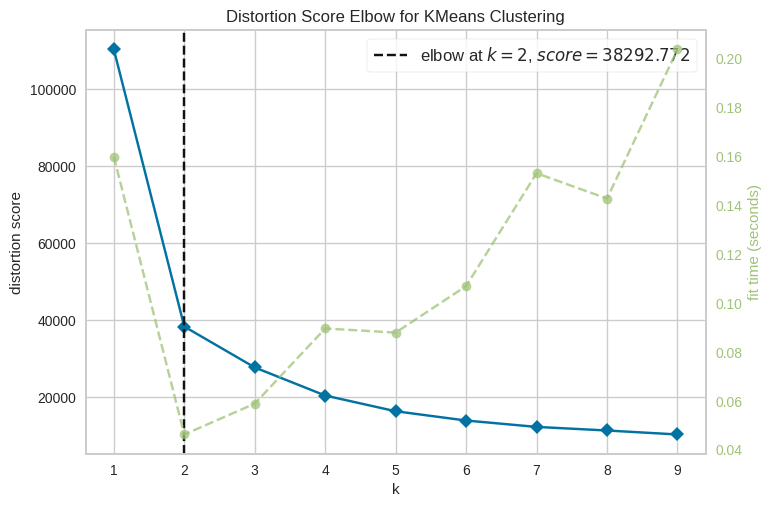

cluster
0    52583
1     2573
Name: count, dtype: int64


In [28]:
# Selecionar variáveis relevantes para a clusterização
df = df_phones[['LATITUDE', 'LONGITUDE']]

# Selecionar variáveis relevantes para o modelo de clusterização
X = df[['LATITUDE', 'LONGITUDE']]

# Tratar valores ausentes (neste caso, podemos remover linhas com valores ausentes)
X.dropna(inplace=True)

# Padronizar os dados
scaler = StandardScaler()
X_padronizado = scaler.fit_transform(X)

# Definir o número máximo de clusters (vamos escolher até 10)
numero_clusters = 10

# Usar o KElbowVisualizer para encontrar o número ideal de clusters
visualizador = KElbowVisualizer(KMeans(), k=(1, numero_clusters))
visualizador.fit(X_padronizado)
visualizador.show()

# Criar e treinar o modelo de clusterização (K-means)
kmeans = KMeans(n_clusters=visualizador.elbow_value_, random_state=42)
kmeans.fit(X_padronizado)

# Adicionar os rótulos dos clusters ao DataFrame original
df['cluster'] = kmeans.labels_

# Visualizar os centróides dos clusters
centroides = scaler.inverse_transform(kmeans.cluster_centers_)

# Contar ocorrências por cluster
print(df['cluster'].value_counts())


In [29]:
# Definir o centro do mapa e o nível de zoom para cobrir toda a área do estado de São Paulo
centro_lat = -23.5505  # Latitude do centro do estado de São Paulo
centro_lon = -46.6333  # Longitude do centro do estado de São Paulo
nivel_zoom = 5  # Zoom suficiente para cobrir toda a área do estado de São Paulo

# Criar o mapa interativo com o Plotly Express
fig = px.scatter_mapbox(df, lat="LATITUDE", lon="LONGITUDE", color="cluster", zoom=nivel_zoom,
                        mapbox_style="carto-positron",
                        title='Clusters de Roubos de Smartphones no Estado de São Paulo',
                        color_discrete_sequence=px.colors.qualitative.Pastel)  # Paleta de cores mais distinta

# Ajustar o tamanho do mapa
fig.update_layout(
    mapbox=dict(
        center=dict(lat=centro_lat, lon=centro_lon),
        zoom=nivel_zoom,
        style='carto-positron'
    )
)

# Adicionar uma legenda explicativa para os clusters
fig.update_layout(
    legend=dict(
        title="Clusters",
        title_font=dict(family="Arial, sans-serif", size=14),
        font=dict(family="Arial, sans-serif", size=12),
        bgcolor="rgba(255, 255, 255, 0.7)"  # Fundo translúcido
    )
)

# Exibir o mapa
fig.show()


In [30]:
data = {
    "Device Vendor": ["Samsung", "Motorola", "Apple", "Xiaomi", "Unknown", "LG", "Asus", "Realme", "Nokia",
                      "Infinix", "Huawei", "Google", "OnePlus", "Lenovo", "Tecno", "Mixc", "Oppo", "Alcatel",
                      "Sony", "Vivo", "Other"],
    "Market Share Perc. (Jan - Dec 2023)": [39.48, 19.97, 18.24, 13.24, 3.89, 3.28, 0.56, 0.29, 0.21,
                                            0.18, 0.12, 0.11, 0.07, 0.06, 0.06, 0.05, 0.04, 0.03,
                                            0.03, 0.03, 0.06]
}

df_statcounter = pd.DataFrame(data).head(10)

fig = px.bar(df_statcounter, x="Device Vendor", y="Market Share Perc. (Jan - Dec 2023)",
             title="Top 10 Market Share of Mobile Device Vendors in Brazil (Jan - Dec 2023)",
             labels={"Device Vendor": "Device Vendor", "Market Share Perc. (Jan - Dec 2023)": "Market Share (%)"},
             color="Device Vendor", color_discrete_sequence=px.colors.qualitative.Pastel)

# Ajustando o layout, incluindo o range para o eixo y, conforme o exemplo
fig.update_layout(
    xaxis_title="Device Vendor",
    yaxis_title="Market Share (%)",
    legend_title="Vendor",
    font=dict(size=12),
    plot_bgcolor='rgba(0,0,0,0)',
    yaxis=dict(range=[0, 45])  # Ajuste o range conforme necessário baseado nos dados
)

# Adicionando anotações diretamente usando os valores de 'Market Share'
for trace in fig.data:
    trace.text = [f"{value:.2f}%" for value in trace.y]
    trace.textposition = 'outside'

# Ajustando as margens para evitar cortes
fig.update_layout(margin=dict(l=20, r=20, t=30, b=20))

# Exibindo o gráfico
fig.show()